In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score, log_loss, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

# 1. Data Preprocessing

In [2]:
training = pd.read_csv("train.csv") # loading training data

training.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [3]:
training.shape

(878049, 9)

In [4]:
training.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   Descript    878049 non-null  object 
 3   DayOfWeek   878049 non-null  object 
 4   PdDistrict  878049 non-null  object 
 5   Resolution  878049 non-null  object 
 6   Address     878049 non-null  object 
 7   X           878049 non-null  float64
 8   Y           878049 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


# 1.2 Cleaning Data

In [5]:
training.isna().sum() #cheaking for NAN values

Dates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64

In [6]:
training.isnull().sum() #cheaking for NULL values 

Dates         0
Category      0
Descript      0
DayOfWeek     0
PdDistrict    0
Resolution    0
Address       0
X             0
Y             0
dtype: int64

In [7]:
print(training.duplicated().sum()) # cheaking dublicates

2323


In [8]:
training.drop_duplicates(inplace = True)

In [9]:
training.shape

(875726, 9)

In [10]:
training.drop(columns=["Descript", "Resolution"], inplace = True) # droping unnecessary column
training.head()

,Dates,Category,DayOfWeek,PdDistrict,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,Wednesday,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,Wednesday,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,Wednesday,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,Wednesday,PARK,100 Block of BRODERICK ST,-122.438738,37.771541


# 1. Data Preprocessing (Continued)

In [11]:
training["DayOfWeek"].unique()

array(['Wednesday', 'Tuesday', 'Monday', 'Sunday', 'Saturday', 'Friday',
       'Thursday'], dtype=object)

In [12]:
# mapping DayOfWeek to numerical values
day_mapping = {
    "Saturday": 1, "Sunday": 2, "Monday": 3, 
    "Tuesday": 4, "Wednesday": 5, "Thursday": 6,
    "Friday": 7
}

# Apply the mapping to dataset
training["DayOfWeek"] = training["DayOfWeek"].replace(day_mapping)

training.head()

,Dates,Category,DayOfWeek,PdDistrict,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,5,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,5,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,5,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,5,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,5,PARK,100 Block of BRODERICK ST,-122.438738,37.771541


In [13]:
# extracting only date without hours and minutes
only_date = lambda x : (x["Dates"].split())[0]

training["Dates"] = training.apply(only_date, axis = 1)

In [14]:
# spliting the date into year, month and day

year = lambda x : int((x["Dates"].split('-'))[0])
month = lambda x : int((x["Dates"].split('-'))[1])
day = lambda x : int((x["Dates"].split('-'))[2])

training["year"] = training.apply(year, axis = 1)
training["month"] = training.apply(month, axis = 1)
training["day"] = training.apply(day, axis = 1)


In [15]:
# droping the Dates column
training.drop(columns=["Dates"], inplace = True)

In [16]:
training.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,day
0,WARRANTS,5,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13
1,OTHER OFFENSES,5,NORTHERN,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13
2,OTHER OFFENSES,5,NORTHERN,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13
3,LARCENY/THEFT,5,NORTHERN,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13
4,LARCENY/THEFT,5,PARK,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13


In [17]:
training["Category"].unique()

array(['WARRANTS', 'OTHER OFFENSES', 'LARCENY/THEFT', 'VEHICLE THEFT',
       'VANDALISM', 'NON-CRIMINAL', 'ROBBERY', 'ASSAULT', 'WEAPON LAWS',
       'BURGLARY', 'SUSPICIOUS OCC', 'DRUNKENNESS',
       'FORGERY/COUNTERFEITING', 'DRUG/NARCOTIC', 'STOLEN PROPERTY',
       'SECONDARY CODES', 'TRESPASS', 'MISSING PERSON', 'FRAUD',
       'KIDNAPPING', 'RUNAWAY', 'DRIVING UNDER THE INFLUENCE',
       'SEX OFFENSES FORCIBLE', 'PROSTITUTION', 'DISORDERLY CONDUCT',
       'ARSON', 'FAMILY OFFENSES', 'LIQUOR LAWS', 'BRIBERY',
       'EMBEZZLEMENT', 'SUICIDE', 'LOITERING',
       'SEX OFFENSES NON FORCIBLE', 'EXTORTION', 'GAMBLING', 'BAD CHECKS',
       'TREA', 'RECOVERED VEHICLE', 'PORNOGRAPHY/OBSCENE MAT'],
      dtype=object)

In [18]:
len(training["Category"].unique())

39

In [19]:
training["PdDistrict"].unique()

array(['NORTHERN', 'PARK', 'INGLESIDE', 'BAYVIEW', 'RICHMOND', 'CENTRAL',
       'TARAVAL', 'TENDERLOIN', 'MISSION', 'SOUTHERN'], dtype=object)

In [20]:
len(training["PdDistrict"].unique())

10

In [21]:
training["Address"].unique()

array(['OAK ST / LAGUNA ST', 'VANNESS AV / GREENWICH ST',
       '1500 Block of LOMBARD ST', ..., '300 Block of JOHN F KENNEDY DR',
       'FOLSOM ST / ZENO PL', '1000 Block of 22ND AV'], dtype=object)

In [22]:
len(training["Address"].unique())

23228

In [23]:
#converting Category, PdDistrict and Address into numeric values

# Encode Category
training['Category'] = training['Category'].astype('category')
Category_mapping =  dict(enumerate(training['Category'].cat.categories))
training['Category'] = training['Category'].cat.codes

# Encode PdDistrict
training['PdDistrict'] = training['PdDistrict'].astype('category')
PdDistrict_mapping = dict(enumerate(training["PdDistrict"].cat.categories))
training['PdDistrict'] = training['PdDistrict'].cat.codes

# Encode Address
training['Address'] = training['Address'].astype('category')
Address_mapping = dict(enumerate(training['Address'].cat.categories))
training['Address'] = training['Address'].cat.codes



In [24]:
training.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,day
0,37,5,4,19790,-122.425892,37.774599,2015,5,13
1,21,5,4,19790,-122.425892,37.774599,2015,5,13
2,21,5,4,22697,-122.424363,37.800414,2015,5,13
3,16,5,4,4266,-122.426995,37.800873,2015,5,13
4,16,5,5,1843,-122.438738,37.771541,2015,5,13


# 1.3 Normalization
![Standard scaling](https://www.thoughtco.com/thmb/hkBlR9QZwh7yCN9gDgYMSHJbsf8=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/zscore-56a8fa785f9b58b7d0f6e87b.GIF)
## Standard Scaler formula

In [25]:
# applying Standard Scaler(z-score normalization) on X and Y
scaler = StandardScaler()

# training data
scaler.fit(training[["X"]])
training["X_scaled"] = scaler.transform(training[["X"]])

scaler.fit(training[["Y"]])
training["Y_scaled"] = scaler.transform(training[["Y"]])



In [26]:
X = training.drop(columns = 'Category')
y = training["Category"]

# spliting the data

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, random_state = 42)

In [27]:
training.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,day,X_scaled,Y_scaled
0,37,5,4,19790,-122.425892,37.774599,2015,5,13,-0.107651,0.007795
1,21,5,4,19790,-122.425892,37.774599,2015,5,13,-0.107651,0.007795
2,21,5,4,22697,-122.424363,37.800414,2015,5,13,-0.057306,0.064223
3,16,5,4,4266,-122.426995,37.800873,2015,5,13,-0.144000,0.065225
4,16,5,5,1843,-122.438738,37.771541,2015,5,13,-0.530728,0.001112


# 2. Application of Mining Techniques (Clustering)

![K-medoids example](https://www.mathworks.com/help/examples/stats/win64/GroupDataIntoTwoClustersKMedoidsExample_02.png)
## The k-modes method is a variant of k-means, which extends the k-means paradigm to cluster nominal
## data by replacing the means of clusters (centroid) with modes.

In [28]:
#choosing year 2015 so we can reduce the number of the data to preform k-medoids
data_for_clustering = training[(training["year"] == 2015)]

In [29]:
# applying k-medoids using X and Y feature

k = 3 # number of clusters

model = KMedoids(n_clusters = k)

clusters = model.fit(data_for_clustering[["X_scaled", "Y_scaled"]])


$$
\large Cost = \sum^{n}_{i=1}{||x_i - m_{c(i)}||}
$$
## where $m_c(i)$ is the medoid 

In [30]:
print(clusters.inertia_)

7614.3444531461955


In [31]:
# generating range of cluster to find the optimal k using the elbow curve method

k_range = range(1,15) 

list_dist = [] 

for k in k_range:
    model = KMedoids(n_clusters=k) 
    model.fit(data_for_clustering[['X_scaled','Y_scaled']])
    list_dist.append(model.inertia_)

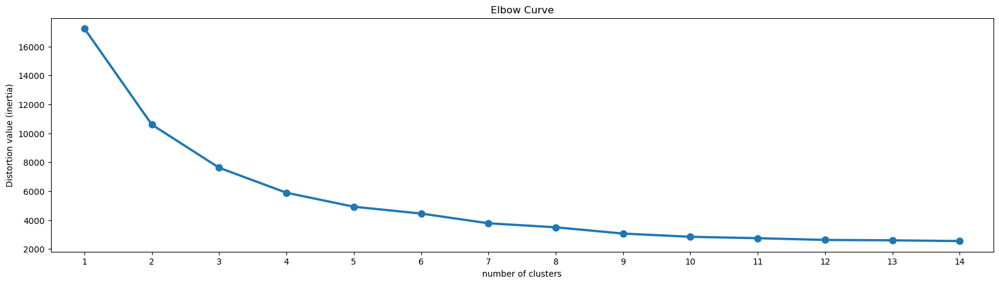

In [32]:
plt.figure(figsize=(20, 5))

plt.xlabel('number of clusters')
plt.ylabel('Distortion value (inertia)')
plt.title("Elbow Curve")
sns.pointplot(x = k_range, y = list_dist)
plt.show()

## From the curve 4 is the optimal number of clusters

In [33]:
k = 4

model = KMedoids(n_clusters = k)

best_clusters = model.fit_predict(data_for_clustering[["X_scaled", "Y_scaled"]])

In [34]:
data_for_clustering["cluster"] = best_clusters

# 2.1 Evaluation metric (clusterning)

In [35]:
# we will use Silhouette Score for cluster evaluation
score = silhouette_score(data_for_clustering[["X_scaled", "Y_scaled"]], best_clusters)
print(score)

0.5008060076524515


In [36]:
# visualizing the result
data_for_clustering["Category"] = data_for_clustering["Category"].map(Category_mapping)
data_for_clustering["Address"] = data_for_clustering["Address"].map(Address_mapping)

In [37]:
data_for_clustering.head()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,day,X_scaled,Y_scaled,cluster
0,WARRANTS,5,4,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,-0.107651,0.007795,0
1,OTHER OFFENSES,5,4,OAK ST / LAGUNA ST,-122.425892,37.774599,2015,5,13,-0.107651,0.007795,0
2,OTHER OFFENSES,5,4,VANNESS AV / GREENWICH ST,-122.424363,37.800414,2015,5,13,-0.057306,0.064223,0
3,LARCENY/THEFT,5,4,1500 Block of LOMBARD ST,-122.426995,37.800873,2015,5,13,-0.144000,0.065225,0
4,LARCENY/THEFT,5,5,100 Block of BRODERICK ST,-122.438738,37.771541,2015,5,13,-0.530728,0.001112,3


In [39]:

figure = px.scatter_mapbox(
    data_for_clustering, 
    lat='Y', 
    lon='X', 
    center=dict(lat=37.77, lon=-122.42),  
    zoom=12,  
    opacity=0.9, 
    mapbox_style='open-street-map',
    color='cluster',
    width=1100, 
    height=700,
    hover_data=['cluster', 'Category', 'Address', 'Y', 'X']
)

figure.show()

# 2.2 Mining Technique (classification)

## Loss function (entropy)

![loss function](https://framerusercontent.com/images/jiDTkbQC7DPO2z2XmxqoeMsrkA.webp)

## Random Forest (Decision Tree + Bagging)

![Random Forest](https://miro.medium.com/v2/resize:fit:592/1*i0o8mjFfCn-uD79-F1Cqkw.png)

In [40]:
X_train.drop(columns=["X","Y"], inplace = True)
X_test.drop(columns=["X", "Y"], inplace = True)

In [41]:
model = RandomForestClassifier(n_estimators = 100 , criterion = "entropy", n_jobs = -1, max_depth = 15)

In [42]:
model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=15, n_jobs=-1)

# 2.3 Evaluation metric (classification)

### log Loss
$$
\large -\frac{1}{N} \sum_{i=1}^{N}{\sum_{j=1}^{M}{y_{ij}log{(p_{ij})}}}
$$


In [43]:
y_train_pred = model.predict_proba(X_train)
y_test_pred = model.predict_proba(X_test)

In [44]:
#training loss
train_accuracy = log_loss(y_train, y_train_pred)
print("Training Loss:", train_accuracy)

Training Loss: 1.9564522736174754


In [45]:
#testing loss
test_accuracy = log_loss(y_test, y_test_pred)
print("Testing Loss:", test_accuracy)

Testing Loss: 2.3675294815742114


# 3. Data Visulization

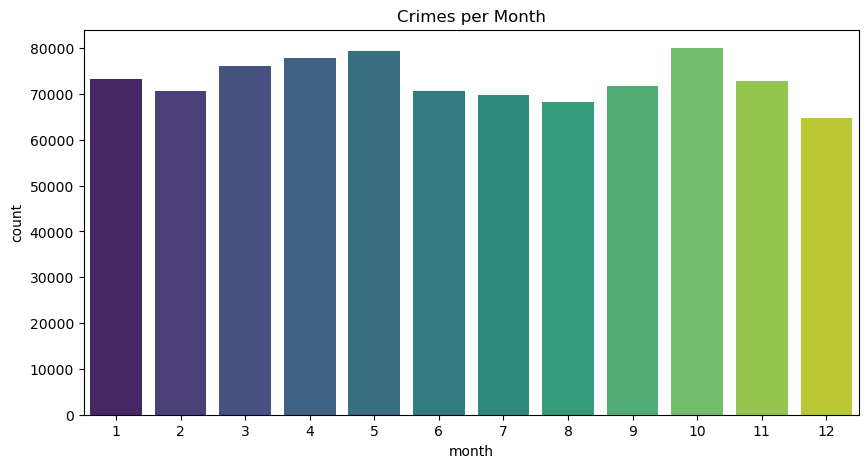

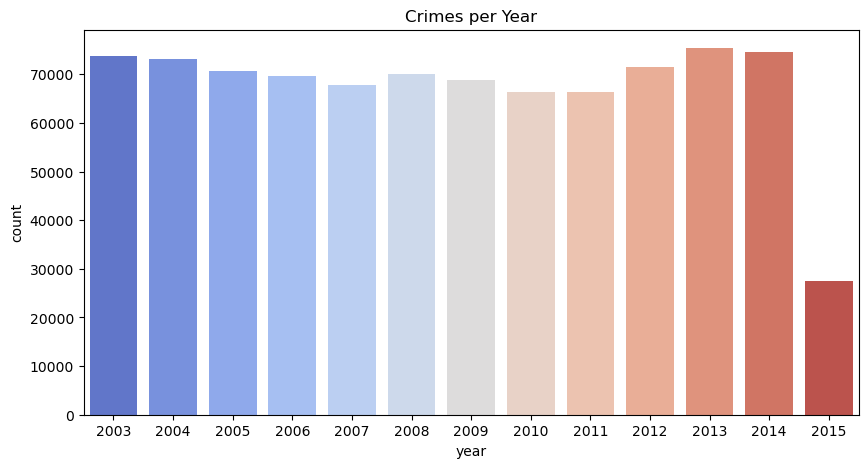

In [46]:
# bar plot for count the crimes per month
plt.figure(figsize=(10,5))
sns.countplot(x='month', data=training,palette='viridis')
plt.title("Crimes per Month")
plt.show()

# bar plot for count the crimes per year
plt.figure(figsize=(10,5))
sns.countplot(x='year', data=training,palette='coolwarm')
plt.title("Crimes per Year")
plt.show()

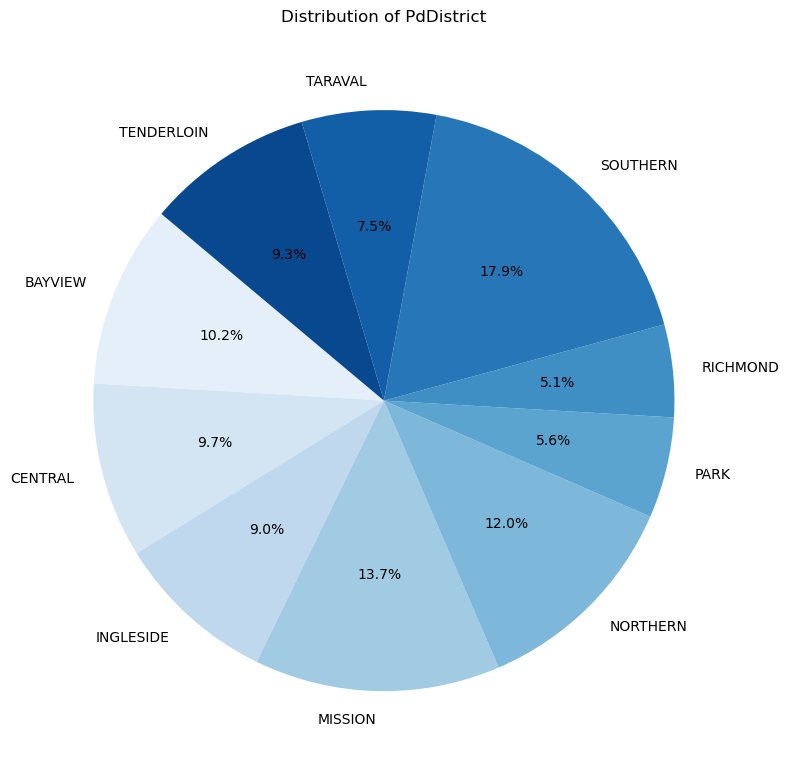

In [30]:
# Pie Chart explain the the percentage of crime in any PdDistrict

training['PdDistrict'] = training['PdDistrict'].map(PdDistrict_mapping)

PdDistrict_counts= training['PdDistrict'].value_counts().sort_index()

plt.figure(figsize=(8, 8))
plt.pie(PdDistrict_counts,
    labels= PdDistrict_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=sns.color_palette("Blues", len(PdDistrict_counts))
            )
plt.title('Distribution of PdDistrict')
plt.axis('equal')
plt.tight_layout()
plt.show()

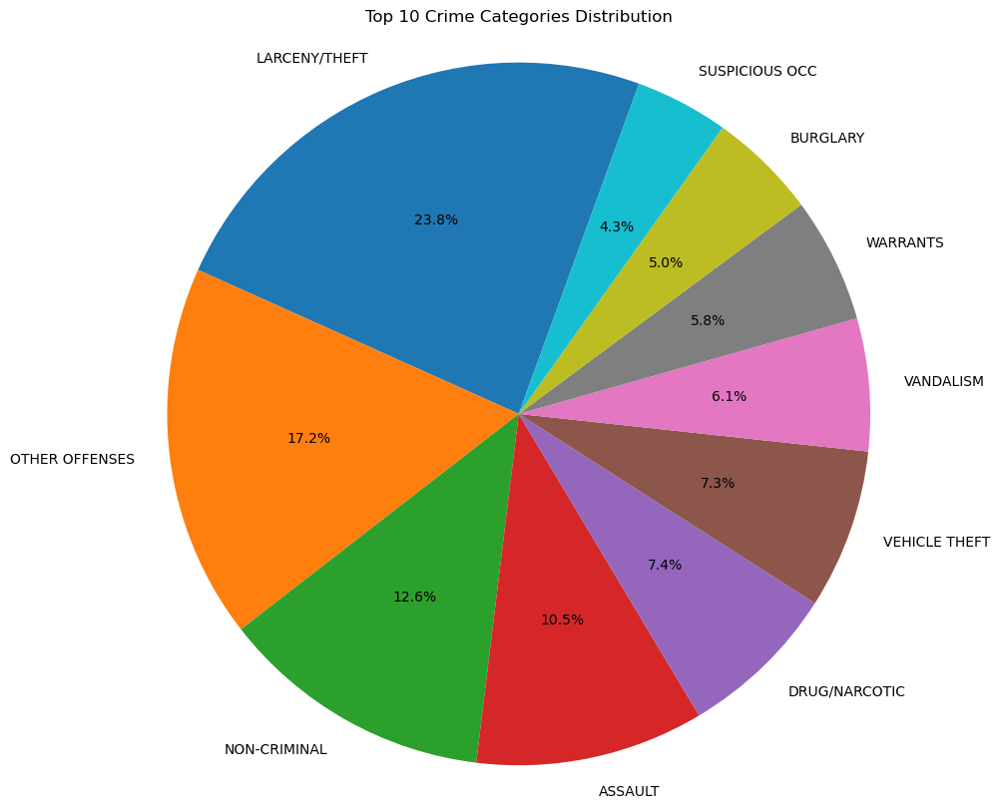

In [33]:
training["Category"] = training["Category"].map(Category_mapping)

top_categories = training['Category'].value_counts().head(10)
plt.figure(figsize=(10,10))
plt.pie(top_categories.values, labels=top_categories.index, autopct='%1.1f%%', startangle=70)
plt.title('Top 10 Crime Categories Distribution')
plt.axis('equal') 
plt.show()
